# Machine Learning Trading Bot

In this Challenge, you’ll assume the role of a financial advisor at one of the top five financial advisory firms in the world. Your firm constantly competes with the other major firms to manage and automatically trade assets in a highly dynamic environment. In recent years, your firm has heavily profited by using computer algorithms that can buy and sell faster than human traders.

The speed of these transactions gave your firm a competitive advantage early on. But, people still need to specifically program these systems, which limits their ability to adapt to new data. You’re thus planning to improve the existing algorithmic trading systems and maintain the firm’s competitive advantage in the market. To do so, you’ll enhance the existing trading signals with machine learning algorithms that can adapt to new data.

## Instructions:

Use the starter code file to complete the steps that the instructions outline. The steps for this Challenge are divided into the following sections:

* Establish a Baseline Performance

* Tune the Baseline Trading Algorithm

* Evaluate a New Machine Learning Classifier

* Create an Evaluation Report

#### Establish a Baseline Performance

In this section, you’ll run the provided starter code to establish a baseline performance for the trading algorithm. To do so, complete the following steps.

Open the Jupyter notebook. Restart the kernel, run the provided cells that correspond with the first three steps, and then proceed to step four. 

1. Import the OHLCV dataset into a Pandas DataFrame.

2. Generate trading signals using short- and long-window SMA values. 

3. Split the data into training and testing datasets.

4. Use the `SVC` classifier model from SKLearn's support vector machine (SVM) learning method to fit the training data and make predictions based on the testing data. Review the predictions.

5. Review the classification report associated with the `SVC` model predictions. 

6. Create a predictions DataFrame that contains columns for “Predicted” values, “Actual Returns”, and “Strategy Returns”.

7. Create a cumulative return plot that shows the actual returns vs. the strategy returns. Save a PNG image of this plot. This will serve as a baseline against which to compare the effects of tuning the trading algorithm.

8. Write your conclusions about the performance of the baseline trading algorithm in the `README.md` file that’s associated with your GitHub repository. Support your findings by using the PNG image that you saved in the previous step.

#### Tune the Baseline Trading Algorithm

In this section, you’ll tune, or adjust, the model’s input features to find the parameters that result in the best trading outcomes. (You’ll choose the best by comparing the cumulative products of the strategy returns.) To do so, complete the following steps:

1. Tune the training algorithm by adjusting the size of the training dataset. To do so, slice your data into different periods. Rerun the notebook with the updated parameters, and record the results in your `README.md` file. Answer the following question: What impact resulted from increasing or decreasing the training window?

> **Hint** To adjust the size of the training dataset, you can use a different `DateOffset` value&mdash;for example, six months. Be aware that changing the size of the training dataset also affects the size of the testing dataset.

2. Tune the trading algorithm by adjusting the SMA input features. Adjust one or both of the windows for the algorithm. Rerun the notebook with the updated parameters, and record the results in your `README.md` file. Answer the following question: What impact resulted from increasing or decreasing either or both of the SMA windows?

3. Choose the set of parameters that best improved the trading algorithm returns. Save a PNG image of the cumulative product of the actual returns vs. the strategy returns, and document your conclusion in your `README.md` file.

#### Evaluate a New Machine Learning Classifier

In this section, you’ll use the original parameters that the starter code provided. But, you’ll apply them to the performance of a second machine learning model. To do so, complete the following steps:

1. Import a new classifier, such as `AdaBoost`, `DecisionTreeClassifier`, or `LogisticRegression`. (For the full list of classifiers, refer to the [Supervised learning page](https://scikit-learn.org/stable/supervised_learning.html) in the scikit-learn documentation.)

2. Using the original training data as the baseline model, fit another model with the new classifier.

3. Backtest the new model to evaluate its performance. Save a PNG image of the cumulative product of the actual returns vs. the strategy returns for this updated trading algorithm, and write your conclusions in your `README.md` file. Answer the following questions: Did this new model perform better or worse than the provided baseline model? Did this new model perform better or worse than your tuned trading algorithm?

#### Create an Evaluation Report

In the previous sections, you updated your `README.md` file with your conclusions. To accomplish this section, you need to add a summary evaluation report at the end of the `README.md` file. For this report, express your final conclusions and analysis. Support your findings by using the PNG images that you created.


In [1]:
# Imports
import pandas as pd
import numpy as np
from pathlib import Path
import hvplot.pandas
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from pandas.tseries.offsets import DateOffset
from sklearn.metrics import classification_report

---

## Establish a Baseline Performance

In this section, you’ll run the provided starter code to establish a baseline performance for the trading algorithm. To do so, complete the following steps.

Open the Jupyter notebook. Restart the kernel, run the provided cells that correspond with the first three steps, and then proceed to step four. 


### Step 1: mport the OHLCV dataset into a Pandas DataFrame.

In [2]:
# Import the OHLCV dataset into a Pandas Dataframe
ohlcv_df = pd.read_csv(
    Path("./Resources/emerging_markets_ohlcv.csv"), 
    index_col='date', 
    infer_datetime_format=True, 
    parse_dates=True
)

# Review the DataFrame
ohlcv_df.head()

,open,high,low,close,volume
date,,,,,
2015-01-21 09:30:00,23.83,23.83,23.83,23.83,100
2015-01-21 11:00:00,23.98,23.98,23.98,23.98,100
2015-01-22 15:00:00,24.42,24.42,24.42,24.42,100
2015-01-22 15:15:00,24.42,24.44,24.42,24.44,200
2015-01-22 15:30:00,24.46,24.46,24.46,24.46,200


In [3]:
# Filter the date index and close columns
signals_df = ohlcv_df.loc[:, ["close"]]

# Use the pct_change function to generate  returns from close prices
signals_df["Actual Returns"] = signals_df["close"].pct_change()

# Drop all NaN values from the DataFrame
signals_df = signals_df.dropna()

# Review the DataFrame
display(signals_df.head())
display(signals_df.tail())

,close,Actual Returns
date,,
2015-01-21 11:00:00,23.98,0.006295
2015-01-22 15:00:00,24.42,0.018349
2015-01-22 15:15:00,24.44,0.000819
2015-01-22 15:30:00,24.46,0.000818
2015-01-26 12:30:00,24.33,-0.005315


,close,Actual Returns
date,,
2021-01-22 09:30:00,33.27,-0.006866
2021-01-22 11:30:00,33.35,0.002405
2021-01-22 13:45:00,33.42,0.002099
2021-01-22 14:30:00,33.47,0.001496
2021-01-22 15:45:00,33.44,-0.000896


## Step 2: Generate trading signals using short- and long-window SMA values. 

In [4]:
# Set the short window and long window
short_window = 4
long_window = 100

# Generate the fast and slow simple moving averages (4 and 100 days, respectively)
signals_df['SMA_Fast'] = signals_df['close'].rolling(window=short_window).mean()
signals_df['SMA_Slow'] = signals_df['close'].rolling(window=long_window).mean()

signals_df = signals_df.dropna()

# Review the DataFrame
display(signals_df.head())
display(signals_df.tail())

,close,Actual Returns,SMA_Fast,SMA_Slow
date,,,,
2015-04-02 14:45:00,24.92,0.000000,24.9175,24.3214
2015-04-02 15:00:00,24.92,0.000000,24.9200,24.3308
2015-04-02 15:15:00,24.94,0.000803,24.9250,24.3360
2015-04-02 15:30:00,24.95,0.000401,24.9325,24.3411
2015-04-02 15:45:00,24.98,0.001202,24.9475,24.3463


,close,Actual Returns,SMA_Fast,SMA_Slow
date,,,,
2021-01-22 09:30:00,33.27,-0.006866,33.2025,30.40215
2021-01-22 11:30:00,33.35,0.002405,33.2725,30.44445
2021-01-22 13:45:00,33.42,0.002099,33.3850,30.48745
2021-01-22 14:30:00,33.47,0.001496,33.3775,30.53085
2021-01-22 15:45:00,33.44,-0.000896,33.4200,30.57495


In [5]:
# Initialize the new Signal column
signals_df['Signal'] = 0.0

# When Actual Returns are greater than or equal to 0, generate signal to buy stock long
signals_df.loc[(signals_df['Actual Returns'] >= 0), 'Signal'] = 1

# When Actual Returns are less than 0, generate signal to sell stock short
signals_df.loc[(signals_df['Actual Returns'] < 0), 'Signal'] = -1

# Review the DataFrame
display(signals_df.head())
display(signals_df.tail())

,close,Actual Returns,SMA_Fast,SMA_Slow,Signal
date,,,,,
2015-04-02 14:45:00,24.92,0.000000,24.9175,24.3214,1.0
2015-04-02 15:00:00,24.92,0.000000,24.9200,24.3308,1.0
2015-04-02 15:15:00,24.94,0.000803,24.9250,24.3360,1.0
2015-04-02 15:30:00,24.95,0.000401,24.9325,24.3411,1.0
2015-04-02 15:45:00,24.98,0.001202,24.9475,24.3463,1.0


,close,Actual Returns,SMA_Fast,SMA_Slow,Signal
date,,,,,
2021-01-22 09:30:00,33.27,-0.006866,33.2025,30.40215,-1.0
2021-01-22 11:30:00,33.35,0.002405,33.2725,30.44445,1.0
2021-01-22 13:45:00,33.42,0.002099,33.3850,30.48745,1.0
2021-01-22 14:30:00,33.47,0.001496,33.3775,30.53085,1.0
2021-01-22 15:45:00,33.44,-0.000896,33.4200,30.57495,-1.0


In [6]:
signals_df['Signal'].value_counts()

 1.0    2368
-1.0    1855
Name: Signal, dtype: int64

In [7]:
# Calculate the strategy returns and add them to the signals_df DataFrame
signals_df['Strategy Returns'] = signals_df['Actual Returns'] * signals_df['Signal'].shift()

# Review the DataFrame
display(signals_df.head())
display(signals_df.tail())

,close,Actual Returns,SMA_Fast,SMA_Slow,Signal,Strategy Returns
date,,,,,,
2015-04-02 14:45:00,24.92,0.000000,24.9175,24.3214,1.0,NaN
2015-04-02 15:00:00,24.92,0.000000,24.9200,24.3308,1.0,0.000000
2015-04-02 15:15:00,24.94,0.000803,24.9250,24.3360,1.0,0.000803
2015-04-02 15:30:00,24.95,0.000401,24.9325,24.3411,1.0,0.000401
2015-04-02 15:45:00,24.98,0.001202,24.9475,24.3463,1.0,0.001202


,close,Actual Returns,SMA_Fast,SMA_Slow,Signal,Strategy Returns
date,,,,,,
2021-01-22 09:30:00,33.27,-0.006866,33.2025,30.40215,-1.0,-0.006866
2021-01-22 11:30:00,33.35,0.002405,33.2725,30.44445,1.0,-0.002405
2021-01-22 13:45:00,33.42,0.002099,33.3850,30.48745,1.0,0.002099
2021-01-22 14:30:00,33.47,0.001496,33.3775,30.53085,1.0,0.001496
2021-01-22 15:45:00,33.44,-0.000896,33.4200,30.57495,-1.0,-0.000896


,Actual Returns,Strategy Returns
date,,
2021-01-22 09:30:00,1.335072,0.614132
2021-01-22 11:30:00,1.338283,0.612655
2021-01-22 13:45:00,1.341091,0.613941
2021-01-22 14:30:00,1.343098,0.614859
2021-01-22 15:45:00,1.341894,0.614308


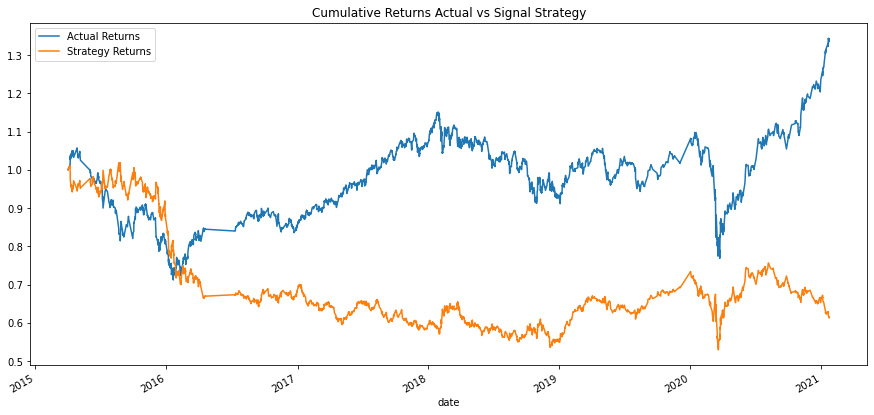

In [8]:
# Altering this cell a little bit to get a better sense of the performance of this signal
# strategy versus the actual returns as well as to more easily report the overall cumulative
# return of the strategy

# Calculate the cumulative stategy return
cum_strategy_return = (1 + signals_df[['Actual Returns','Strategy Returns']]).cumprod()

# display the end of the cumulative return
display(cum_strategy_return.tail())

# Plot Strategy Returns to examine performance
cum_actual_strategy_plot=cum_strategy_return.plot(    
    figsize=(15,7),
    title='Cumulative Returns Actual vs Signal Strategy')

In [9]:
# save plot
cum_actual_strategy_plot.figure.savefig('images/actual_vs_Signal_strategy_cum_returns.png', bbox_inches='tight')

### Step 3: Split the data into training and testing datasets.

In [10]:
# Assign a copy of the sma_fast and sma_slow columns to a features DataFrame called X
X = signals_df[['SMA_Fast', 'SMA_Slow']].shift().dropna()

# Review the DataFrame
X.head()

,SMA_Fast,SMA_Slow
date,,
2015-04-02 15:00:00,24.9175,24.3214
2015-04-02 15:15:00,24.9200,24.3308
2015-04-02 15:30:00,24.9250,24.3360
2015-04-02 15:45:00,24.9325,24.3411
2015-04-06 09:30:00,24.9475,24.3463


In [11]:
# Create the target set selecting the Signal column and assiging it to y
y = signals_df['Signal']

# Review the value counts
y.value_counts()

 1.0    2368
-1.0    1855
Name: Signal, dtype: int64

In [12]:
# Select the start of the training period
training_begin = X.index.min()

# Display the training begin date
print(training_begin)

2015-04-02 15:00:00


In [13]:
# Select the ending period for the training data with an offset of 3 months
training_end = X.index.min() + DateOffset(months=3)

# Display the training end date
print(training_end)

2015-07-02 15:00:00


In [14]:
# Generate the X_train and y_train DataFrames
X_train = X.loc[training_begin:training_end]
y_train = y.loc[training_begin:training_end]

# Review the X_train DataFrame
X_train.head()

,SMA_Fast,SMA_Slow
date,,
2015-04-02 15:00:00,24.9175,24.3214
2015-04-02 15:15:00,24.9200,24.3308
2015-04-02 15:30:00,24.9250,24.3360
2015-04-02 15:45:00,24.9325,24.3411
2015-04-06 09:30:00,24.9475,24.3463


In [15]:
# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end+DateOffset(hours=1):]
y_test = y.loc[training_end+DateOffset(hours=1):]

# Review the X_test DataFrame
X_train.head()

,SMA_Fast,SMA_Slow
date,,
2015-04-02 15:00:00,24.9175,24.3214
2015-04-02 15:15:00,24.9200,24.3308
2015-04-02 15:30:00,24.9250,24.3360
2015-04-02 15:45:00,24.9325,24.3411
2015-04-06 09:30:00,24.9475,24.3463


In [16]:
# Scale the features DataFrames

# Create a StandardScaler instance
scaler = StandardScaler()

# Apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)

# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

### Step 4: Use the `SVC` classifier model from SKLearn's support vector machine (SVM) learning method to fit the training data and make predictions based on the testing data. Review the predictions.

In [17]:
# From SVM, instantiate SVC classifier model instance
svm_model = svm.SVC()
 
# Fit the model to the data using the training data
svm_model = svm_model.fit(X_train_scaled, y_train)
 
# Use the testing data to make the model predictions
svm_pred = svm_model.predict(X_test_scaled)

# Review the model's predicted values
print('SVC classifier predistions')
display(svm_pred)


SVC classifier predistions


array([1., 1., 1., ..., 1., 1., 1.])

### Step 5: Review the classification report associated with the `SVC` model predictions. 

In [18]:
# Use a classification report to evaluate the model using the predictions and testing data
svm_testing_report = classification_report(y_test,svm_pred)

# Print the classification report
print(svm_testing_report)

              precision    recall  f1-score   support

        -1.0       0.43      0.04      0.07      1804
         1.0       0.56      0.96      0.71      2288

    accuracy                           0.55      4092
   macro avg       0.49      0.50      0.39      4092
weighted avg       0.50      0.55      0.43      4092



### Step 6: Create a predictions DataFrame that contains columns for “Predicted” values, “Actual Returns”, and “Strategy Returns”.

In [19]:
# Create a new empty predictions DataFrame.

# Create a predictions DataFrame
predictions_df = pd.DataFrame(index=X_test.index)

# Add the SVM model predictions to the DataFrame
predictions_df['Predicted'] = svm_pred

# Add the actual returns to the DataFrame
predictions_df['Actual Returns'] = signals_df['Actual Returns']

# Add the strategy returns to the DataFrame
predictions_df['Strategy Returns'] = (predictions_df['Actual Returns'] * predictions_df['Predicted'])

# Review the DataFrame
display(predictions_df.head())
display(predictions_df.tail())

,Predicted,Actual Returns,Strategy Returns
date,,,
2015-07-06 10:00:00,1.0,-0.025715,-0.025715
2015-07-06 10:45:00,1.0,0.007237,0.007237
2015-07-06 14:15:00,1.0,-0.009721,-0.009721
2015-07-06 14:30:00,1.0,-0.003841,-0.003841
2015-07-07 11:30:00,1.0,-0.018423,-0.018423


,Predicted,Actual Returns,Strategy Returns
date,,,
2021-01-22 09:30:00,1.0,-0.006866,-0.006866
2021-01-22 11:30:00,1.0,0.002405,0.002405
2021-01-22 13:45:00,1.0,0.002099,0.002099
2021-01-22 14:30:00,1.0,0.001496,0.001496
2021-01-22 15:45:00,1.0,-0.000896,-0.000896


### Step 7: Create a cumulative return plot that shows the actual returns vs. the strategy returns. Save a PNG image of this plot. This will serve as a baseline against which to compare the effects of tuning the trading algorithm.

,Actual Returns,Strategy Returns
date,,
2021-01-22 09:30:00,1.379925,1.509892
2021-01-22 11:30:00,1.383243,1.513523
2021-01-22 13:45:00,1.386147,1.516700
2021-01-22 14:30:00,1.388221,1.518969
2021-01-22 15:45:00,1.386976,1.517607


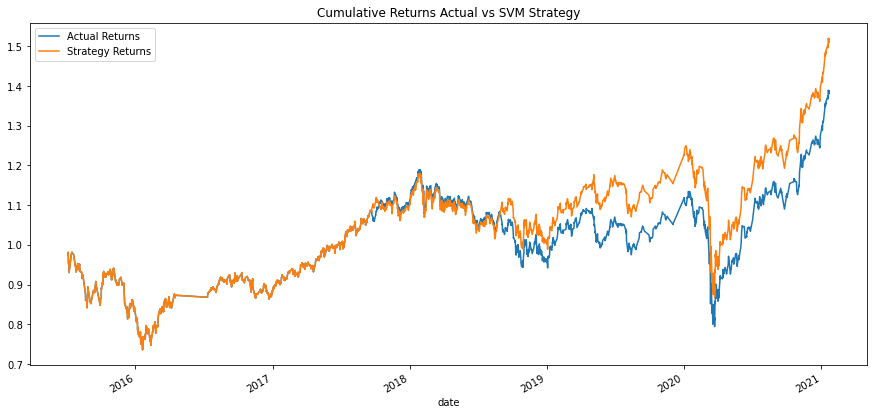

In [20]:
# Calculate the cumulative stategy return
cum_strategy_return = (1 + predictions_df[['Actual Returns','Strategy Returns']]).cumprod()

# display the end of the cumulative return
display(cum_strategy_return.tail())

# Plot Strategy Returns to examine performance
cum_actual_strategy_plot=cum_strategy_return.plot(    
    figsize=(15,7),
    title='Cumulative Returns Actual vs SVM Strategy'
)


In [21]:
# save plot
cum_actual_strategy_plot.figure.savefig('images/actual_vs_SVM_strategy_cum_returns.png', bbox_inches='tight')

---

## Tune the Baseline Trading Algorithm

## Step 6: Use an Alternative ML Model and Evaluate Strategy Returns

In this section, you’ll tune, or adjust, the model’s input features to find the parameters that result in the best trading outcomes. You’ll choose the best by comparing the cumulative products of the strategy returns.

### Step 1: Tune the training algorithm by adjusting the size of the training dataset. 

To do so, slice your data into different periods. Rerun the notebook with the updated parameters, and record the results in your `README.md` file. 

Answer the following question: What impact resulted from increasing or decreasing the training window?

### Step 2: Tune the trading algorithm by adjusting the SMA input features. 

Adjust one or both of the windows for the algorithm. Rerun the notebook with the updated parameters, and record the results in your `README.md` file. 

Answer the following question: What impact resulted from increasing or decreasing either or both of the SMA windows?

### Step 3: Choose the set of parameters that best improved the trading algorithm returns. 

Save a PNG image of the cumulative product of the actual returns vs. the strategy returns, and document your conclusion in your `README.md` file.

In [22]:
# create helper methods to facilitate assessing permutations

def make_signals_df(short_window,long_window):
    # Filter the date index and close columns
    signals_df = ohlcv_df.loc[:, ["close"]]

    # Use the pct_change function to generate  returns from close prices
    signals_df["Actual Returns"] = signals_df["close"].pct_change()

    # Generate the fast and slow simple moving averages (4 and 100 days, respectively)
    signals_df['SMA_Fast'] = signals_df['close'].rolling(window=short_window).mean()
    signals_df['SMA_Slow'] = signals_df['close'].rolling(window=long_window).mean()
    
    # Drop all NaN values from the DataFrame
    signals_df = signals_df.dropna()
    
    # Initialize the new Signal column
    signals_df['Signal'] = 0.0

    # When Actual Returns are greater than or equal to 0, generate signal to buy stock long
    signals_df.loc[(signals_df['Actual Returns'] >= 0), 'Signal'] = 1

    # When Actual Returns are less than 0, generate signal to sell stock short
    signals_df.loc[(signals_df['Actual Returns'] < 0), 'Signal'] = -1    
    
    # Calculate the strategy returns and add them to the signals_df DataFrame
    signals_df['Strategy Returns'] = signals_df['Actual Returns'] * signals_df['Signal'].shift()
    
    return signals_df

def create_train_test_datasets(months):
    # calculate the trainind start and end based on the given training months
    training_begin = X.index.min()
    training_end = X.index.min() + DateOffset(months=months)

    # create the training features dataset X_train and training classigication labels y_train for the training timeframe
    X_train = X.loc[training_begin:training_end]
    y_train = y.loc[training_begin:training_end]

    # create the testing features dataset X_test and testing classigication labels y_test following the training timeframe
    X_test = X.loc[training_end+DateOffset(hours=1):]
    y_test = y.loc[training_end+DateOffset(hours=1):]
    
    # Use StandardScaler to scale the data.
    # Scale the features DataFrames

    # Create a StandardScaler instance
    scaler = StandardScaler()

    # Apply the scaler model to fit the X-train data
    X_scaler = scaler.fit(X_train)

    # Transform the X_train and X_test DataFrames using the X_scaler
    X_train_scaled = X_scaler.transform(X_train)
    X_test_scaled = X_scaler.transform(X_test)  
    return X_train_scaled, y_train, X_test_scaled, y_test

def get_predictions(model,X_train_scaled,y_train,X_test_scaled):
    
    # Fit the model using the training data
    model = model.fit(X_train_scaled,y_train)

    # Use the testing dataset to generate the predictions for the new model
    # store these in disctionary associated with the model architecture being evaluated
    predictions = model.predict(X_test_scaled)

    return predictions
    
def backtest_model(model_name, y_test, y_predictions, actual_returns):
    
    # Use a classification report to evaluate the model using the predictions and testing data
    model_classification_report = classification_report(y_test, y_predictions)

    # Backtest model performance

    # Create a new empty predictions DataFrame.
    # Create a predictions DataFrame
    df=pd.DataFrame(index=y_test.index)

    # Add the alternate model predictions to the DataFrame
    df['Predicted'] = y_predictions

    # Add the actual returns to the DataFrame
    df['Actual Returns'] = actual_returns

    df = df.dropna()

    # Add the strategy returns to the DataFrame
    df['Strategy Returns'] = (df['Actual Returns'] * df['Predicted'])

    # Calculate the cumulative stategy return
    df['strategy_cum_return'] = (1 + df["Strategy Returns"]).cumprod()

    # Calculate the actual stategy return
    df['actual_cum_return'] = (1 + df["Actual Returns"]).cumprod()

#     # Plot the actual returns versus the strategy returns
#     cum_actual_strategy_plot = df[['actual_cum_return','strategy_cum_return']].plot(
#         figsize=(15,7),
#         title=f'Cumulative Returns Actual vs Strategy for model {model_name}'
#     )
#     # save plot
#     cum_actual_strategy_plot.figure.savefig(f'images/{model_name}_actual_vs_strategy_cum_returns.png', bbox_inches='tight')
    
    return df

In [23]:
# Define tuning permutations

# Tune models by evaluationg several training dataset sizes
training_dataset_months = [3,6,12,18]

# Tune models by evaluationg several short SMA window sizes
short_window_sizes = [3,4,6]

# Tune models by evaluationg several long SMA window sizes
long_window_sizes = [60,180,252]

# define a dictionary to manage machine learning models
alternate_models = {}

# add the SVC model
alternate_models['SVC'] = {
        "model": svm.SVC()
    }


date,2021-01-22 15:45:00
actual,1.396242
signal,0.654813
SVC-tr(3)-sw(3)-lw(60),1.517607
SVC-tr(3)-sw(3)-lw(180),1.517607
SVC-tr(3)-sw(3)-lw(252),1.554355
SVC-tr(3)-sw(4)-lw(60),1.517607
SVC-tr(3)-sw(4)-lw(180),1.517607
SVC-tr(3)-sw(4)-lw(252),1.554355
SVC-tr(3)-sw(6)-lw(60),1.517607
SVC-tr(3)-sw(6)-lw(180),1.517607


maximum cumulative return for SVC models was 1.84166422011223 from model permutation SVC-tr(6)-sw(3)-lw(60)


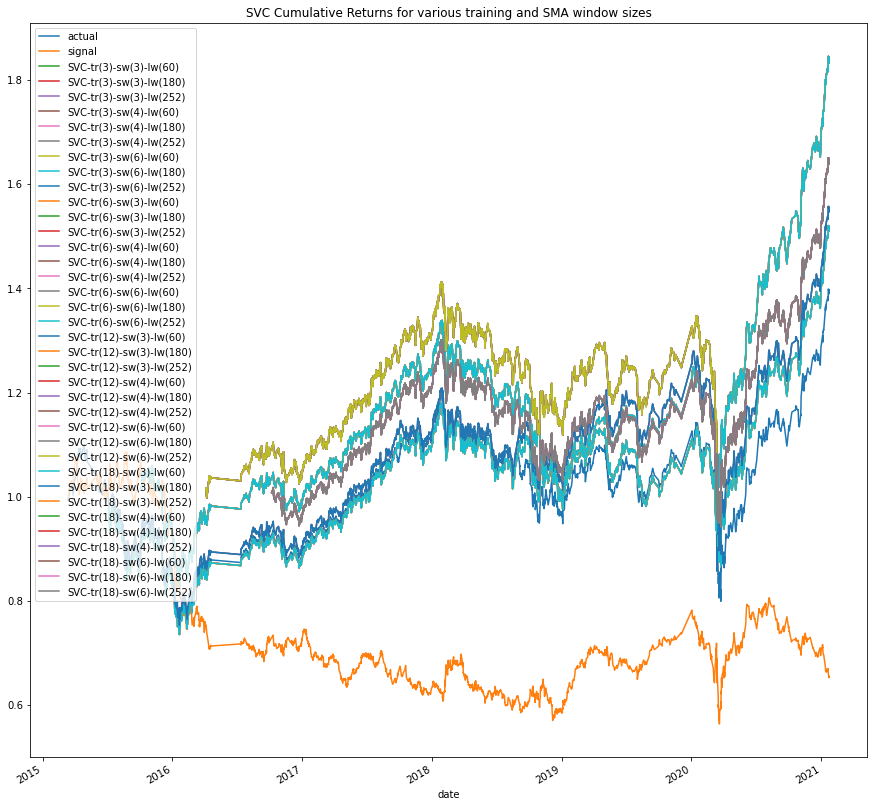

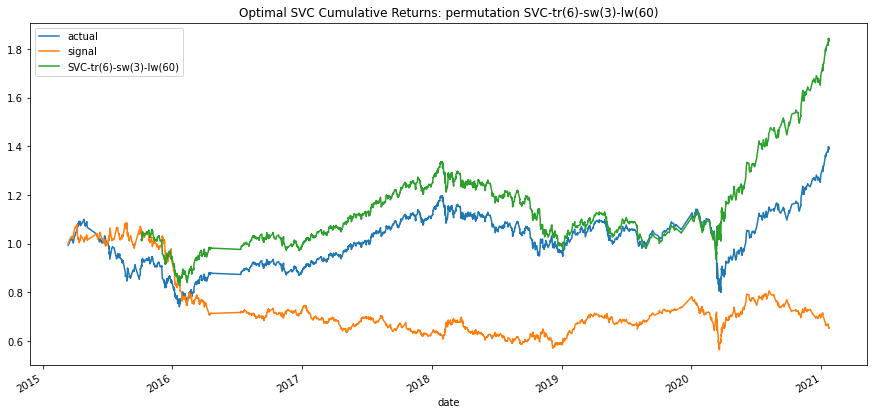

In [25]:
# suppress warnings
import warnings
warnings.filterwarnings('ignore')

models = {}
# construct the model permutations and evaluate the model permutations
for name in alternate_models:
    
    returns = None
    max_return = 0
    selected_model = None
    for training_months in training_dataset_months:
        for short_window_size in short_window_sizes:
            for long_window_size in long_window_sizes:
                # create a key for this model permutation
                model_key = f"{name}-tr({training_months})-sw({short_window_size})-lw({long_window_size})"
                
                # configure model permutation
                models[model_key] = {
                    "model_name":name,
                    "training_months":training_months,
                    "short_window_size":short_window_size,
                    "long_window_size":long_window_size,
                    "model":alternate_models[name]["model"],
                }
                
                # create the signals data set with the actual returns, fast and slow SMA, signal and strategy returns
                models[model_key]['signals_df'] = make_signals_df(short_window_size,long_window_size)

                # create training and testing datasets
                models[model_key]['X_train_scaled'], models[model_key]['y_train'], models[model_key]['X_test_scaled'], models[model_key]['y_test'] = create_train_test_datasets(training_months)

                # get predictions
                models[model_key]['y_predictions'] =  get_predictions(
                    models[model_key]['model'], 
                    models[model_key]['X_train_scaled'], 
                    models[model_key]['y_train'], 
                    models[model_key]['X_test_scaled'])

                # backtest model
                models[model_key]['backtest'] = backtest_model(
                    model_key,
                    models[model_key]['y_test'],
                    models[model_key]['y_predictions'],
                    models[model_key]['signals_df'].loc[models[model_key]['y_test'].index.min():,'Actual Returns'],
                )   
                
                # add the cumulative return to the list of returns for plotting
                # add the actual and signal returns if the 
                if returns is None:
                    # This is the permutation for the model
                    # create the returns dataframe and add the actual returns and the signal returns
                    returns = {
                        "actual": (1 + models[model_key]['signals_df']['Actual Returns']).cumprod(),
                        "signal": (1 + models[model_key]['signals_df']['Strategy Returns']).cumprod()
                    }
                returns[model_key] = models[model_key]['backtest']['strategy_cum_return']
                if returns[model_key].iloc[-1] > max_return:
                    max_return = returns[model_key].iloc[-1]
                    selected_model = model_key
                    
    # create a plot for the family of returns for the range of training monts, and SMA window sizes
    returns_df = pd.DataFrame(returns)
    model_family_plot = returns_df.plot(
        figsize=(15,15),
        title=f'{name} Cumulative Returns for various training and SMA window sizes'
    )
    
    # save plot
    model_family_plot.figure.savefig(f'images/{name}_returns.png', bbox_inches='tight')

    # show the final returns for the family
    display(returns_df.iloc[-1:,:].T)

    # show the max return achieved with the model
    print(f"maximum cumulative return for {name} models was {max_return} from model permutation {selected_model}")
    
    selected_model_plot = returns_df[['actual','signal',selected_model]].plot(
        figsize=(15,7),
        title=f'Optimal {name} Cumulative Returns: permutation {selected_model}'
    )
    
    # save plot
    selected_model_plot.figure.savefig(f'images/{selected_model}_returns.png', bbox_inches='tight')
           

---

## Evaluate a New Machine Learning Classifier

In this section, you’ll use the original parameters that the starter code provided. But, you’ll apply them to the performance of a second machine learning model. 

### Step 1:  Import a new classifier, such as `AdaBoost`, `DecisionTreeClassifier`, or `LogisticRegression`. (For the full list of classifiers, refer to the [Supervised learning page](https://scikit-learn.org/stable/supervised_learning.html) in the scikit-learn documentation.)

In [26]:
# Deviating slightly from these instructions, will attempt to evaluate multiple 
# machine learning architetures in an automated manner.

# Import a new classifiers from SKLearn
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB

# define a dictionary to manage each machine learning 
alternate_models = {}

# Initiate the model instances
# add SVC to set even thought it was done previously to make it 
# easier to compare

alternate_models['SVC'] = {
        "model": svm.SVC()
    }
alternate_models['LogisticRegression'] = {
        "model": LogisticRegression()
    }
alternate_models['DecisionTreeClassifier'] = {
        "model": DecisionTreeClassifier()
    }
alternate_models['GradientBoostingClassifier'] = {
        "model": GradientBoostingClassifier()
    }
alternate_models['AdaBoostClassifier'] = {
        "model": AdaBoostClassifier()
    }
alternate_models['GaussianNB'] = {
        "model": GaussianNB()
    }


### Step 2: Using the original training data as the baseline model, fit another model with the new classifier.

In [27]:
# Altering the instructions a little to automate iterating through multiple machine learning architectures

for name in alternate_models:
    # Retrieve model instance from dictionary
    model = alternate_models[name]['model']
    
    # Fit the model using the training data
    model = model.fit(X_train_scaled,y_train)

    # Use the testing dataset to generate the predictions for the new model
    # store these in disctionary associated with the model architecture being evaluated
    alternate_models[name]['testing_predictions'] = model.predict(X_test_scaled)

    # Review the model's predicted values
    print(f"{name} predictions: {alternate_models[name]['testing_predictions']}")


SVC predictions: [1. 1. 1. ... 1. 1. 1.]
LogisticRegression predictions: [ 1.  1.  1. ... -1. -1. -1.]
DecisionTreeClassifier predictions: [ 1. -1. -1. ... -1. -1. -1.]
GradientBoostingClassifier predictions: [ 1. -1. -1. ... -1. -1. -1.]
AdaBoostClassifier predictions: [ 1. -1. -1. ...  1.  1.  1.]
GaussianNB predictions: [1. 1. 1. ... 1. 1. 1.]


### Step 3: Backtest the new model to evaluate its performance. 

Save a PNG image of the cumulative product of the actual returns vs. the strategy returns for this updated trading algorithm, and write your conclusions in your `README.md` file. 

Answer the following questions: 
Did this new model perform better or worse than the provided baseline model? 
Did this new model perform better or worse than your tuned trading algorithm?

In [28]:
# Altering the instructions a little to automate iterating through multiple machine learning architectures
# Backtest each of the models

for name in alternate_models:
    # Use a classification report to evaluate the model using the predictions and testing data
    alternate_models[name]['classification_report'] = classification_report(y_test, alternate_models[name]['testing_predictions'])

    # Print the classification report
    print(f"""
    {name} classification report: 
    ---------------------------------------------------------------------------
    {alternate_models[name]['classification_report']}
    ---------------------------------------------------------------------------
    """)


    SVC classification report: 
    ---------------------------------------------------------------------------
                  precision    recall  f1-score   support

        -1.0       0.43      0.04      0.07      1804
         1.0       0.56      0.96      0.71      2288

    accuracy                           0.55      4092
   macro avg       0.49      0.50      0.39      4092
weighted avg       0.50      0.55      0.43      4092

    ---------------------------------------------------------------------------
    

    LogisticRegression classification report: 
    ---------------------------------------------------------------------------
                  precision    recall  f1-score   support

        -1.0       0.44      0.33      0.38      1804
         1.0       0.56      0.66      0.61      2288

    accuracy                           0.52      4092
   macro avg       0.50      0.50      0.49      4092
weighted avg       0.51      0.52      0.51      4092

    --------

In [29]:
# Altering the instructions a little to automate iterating through multiple machine learning architectures
# iterate through each of the models

for name in alternate_models:

    # Create a new empty predictions DataFrame.
    # Create a predictions DataFrame
    alternate_models[name]['df']=pd.DataFrame(index=X_test.index)

    # Add the alternate model predictions to the DataFrame
    alternate_models[name]['df']['Predicted'] = alternate_models[name]['testing_predictions']

    # Add the actual returns to the DataFrame
    alternate_models[name]['df']['Actual Returns'] = predictions_df['Actual Returns']

    # Add the strategy returns to the DataFrame
    alternate_models[name]['df']['Strategy Returns'] = (alternate_models[name]['df']['Actual Returns'] * alternate_models[name]['testing_predictions'])

    # Review the DataFrame
    print(f'Preview of {name} returns dataframe:')
    display(alternate_models[name]['df'].head())


Preview of SVC returns dataframe:


,Predicted,Actual Returns,Strategy Returns
date,,,
2015-07-06 10:00:00,1.0,-0.025715,-0.025715
2015-07-06 10:45:00,1.0,0.007237,0.007237
2015-07-06 14:15:00,1.0,-0.009721,-0.009721
2015-07-06 14:30:00,1.0,-0.003841,-0.003841
2015-07-07 11:30:00,1.0,-0.018423,-0.018423


Preview of LogisticRegression returns dataframe:


,Predicted,Actual Returns,Strategy Returns
date,,,
2015-07-06 10:00:00,1.0,-0.025715,-0.025715
2015-07-06 10:45:00,1.0,0.007237,0.007237
2015-07-06 14:15:00,1.0,-0.009721,-0.009721
2015-07-06 14:30:00,1.0,-0.003841,-0.003841
2015-07-07 11:30:00,1.0,-0.018423,-0.018423


Preview of DecisionTreeClassifier returns dataframe:


,Predicted,Actual Returns,Strategy Returns
date,,,
2015-07-06 10:00:00,1.0,-0.025715,-0.025715
2015-07-06 10:45:00,-1.0,0.007237,-0.007237
2015-07-06 14:15:00,-1.0,-0.009721,0.009721
2015-07-06 14:30:00,-1.0,-0.003841,0.003841
2015-07-07 11:30:00,-1.0,-0.018423,0.018423


Preview of GradientBoostingClassifier returns dataframe:


,Predicted,Actual Returns,Strategy Returns
date,,,
2015-07-06 10:00:00,1.0,-0.025715,-0.025715
2015-07-06 10:45:00,-1.0,0.007237,-0.007237
2015-07-06 14:15:00,-1.0,-0.009721,0.009721
2015-07-06 14:30:00,-1.0,-0.003841,0.003841
2015-07-07 11:30:00,-1.0,-0.018423,0.018423


Preview of AdaBoostClassifier returns dataframe:


,Predicted,Actual Returns,Strategy Returns
date,,,
2015-07-06 10:00:00,1.0,-0.025715,-0.025715
2015-07-06 10:45:00,-1.0,0.007237,-0.007237
2015-07-06 14:15:00,-1.0,-0.009721,0.009721
2015-07-06 14:30:00,-1.0,-0.003841,0.003841
2015-07-07 11:30:00,-1.0,-0.018423,0.018423


Preview of GaussianNB returns dataframe:


,Predicted,Actual Returns,Strategy Returns
date,,,
2015-07-06 10:00:00,1.0,-0.025715,-0.025715
2015-07-06 10:45:00,1.0,0.007237,0.007237
2015-07-06 14:15:00,1.0,-0.009721,-0.009721
2015-07-06 14:30:00,1.0,-0.003841,-0.003841
2015-07-07 11:30:00,1.0,-0.018423,-0.018423


SVC Strategy Cumulative Return Preview:


,Predicted,Actual Returns,Strategy Returns,strategy_cum_return,actual_cum_return
date,,,,,
2021-01-22 09:30:00,1.0,-0.006866,-0.006866,1.509892,1.379925
2021-01-22 11:30:00,1.0,0.002405,0.002405,1.513523,1.383243
2021-01-22 13:45:00,1.0,0.002099,0.002099,1.516700,1.386147
2021-01-22 14:30:00,1.0,0.001496,0.001496,1.518969,1.388221
2021-01-22 15:45:00,1.0,-0.000896,-0.000896,1.517607,1.386976


LogisticRegression Strategy Cumulative Return Preview:


,Predicted,Actual Returns,Strategy Returns,strategy_cum_return,actual_cum_return
date,,,,,
2021-01-22 09:30:00,-1.0,-0.006866,0.006866,1.155177,1.379925
2021-01-22 11:30:00,-1.0,0.002405,-0.002405,1.152399,1.383243
2021-01-22 13:45:00,-1.0,0.002099,-0.002099,1.149980,1.386147
2021-01-22 14:30:00,-1.0,0.001496,-0.001496,1.148260,1.388221
2021-01-22 15:45:00,-1.0,-0.000896,0.000896,1.149289,1.386976


DecisionTreeClassifier Strategy Cumulative Return Preview:


,Predicted,Actual Returns,Strategy Returns,strategy_cum_return,actual_cum_return
date,,,,,
2021-01-22 09:30:00,-1.0,-0.006866,0.006866,0.526754,1.379925
2021-01-22 11:30:00,-1.0,0.002405,-0.002405,0.525487,1.383243
2021-01-22 13:45:00,-1.0,0.002099,-0.002099,0.524384,1.386147
2021-01-22 14:30:00,-1.0,0.001496,-0.001496,0.523600,1.388221
2021-01-22 15:45:00,-1.0,-0.000896,0.000896,0.524069,1.386976


GradientBoostingClassifier Strategy Cumulative Return Preview:


,Predicted,Actual Returns,Strategy Returns,strategy_cum_return,actual_cum_return
date,,,,,
2021-01-22 09:30:00,-1.0,-0.006866,0.006866,0.650664,1.379925
2021-01-22 11:30:00,-1.0,0.002405,-0.002405,0.649099,1.383243
2021-01-22 13:45:00,-1.0,0.002099,-0.002099,0.647737,1.386147
2021-01-22 14:30:00,-1.0,0.001496,-0.001496,0.646768,1.388221
2021-01-22 15:45:00,-1.0,-0.000896,0.000896,0.647347,1.386976


AdaBoostClassifier Strategy Cumulative Return Preview:


,Predicted,Actual Returns,Strategy Returns,strategy_cum_return,actual_cum_return
date,,,,,
2021-01-22 09:30:00,1.0,-0.006866,-0.006866,1.562834,1.379925
2021-01-22 11:30:00,1.0,0.002405,0.002405,1.566592,1.383243
2021-01-22 13:45:00,1.0,0.002099,0.002099,1.569880,1.386147
2021-01-22 14:30:00,1.0,0.001496,0.001496,1.572229,1.388221
2021-01-22 15:45:00,1.0,-0.000896,-0.000896,1.570820,1.386976


GaussianNB Strategy Cumulative Return Preview:


,Predicted,Actual Returns,Strategy Returns,strategy_cum_return,actual_cum_return
date,,,,,
2021-01-22 09:30:00,1.0,-0.006866,-0.006866,1.733323,1.379925
2021-01-22 11:30:00,1.0,0.002405,0.002405,1.737491,1.383243
2021-01-22 13:45:00,1.0,0.002099,0.002099,1.741138,1.386147
2021-01-22 14:30:00,1.0,0.001496,0.001496,1.743743,1.388221
2021-01-22 15:45:00,1.0,-0.000896,-0.000896,1.742180,1.386976


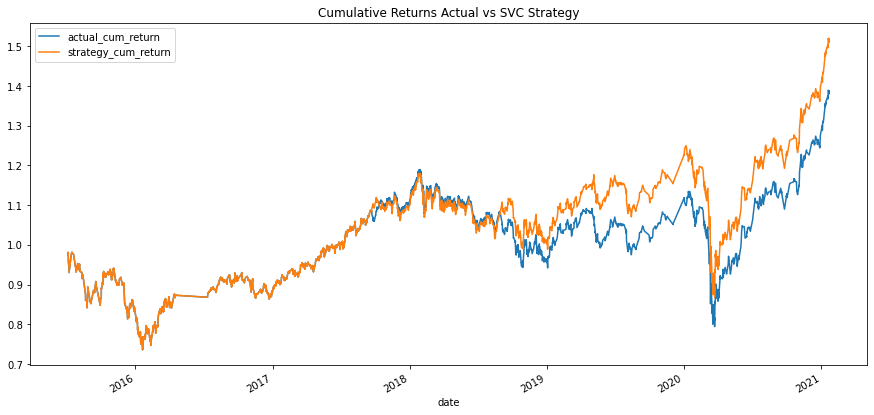

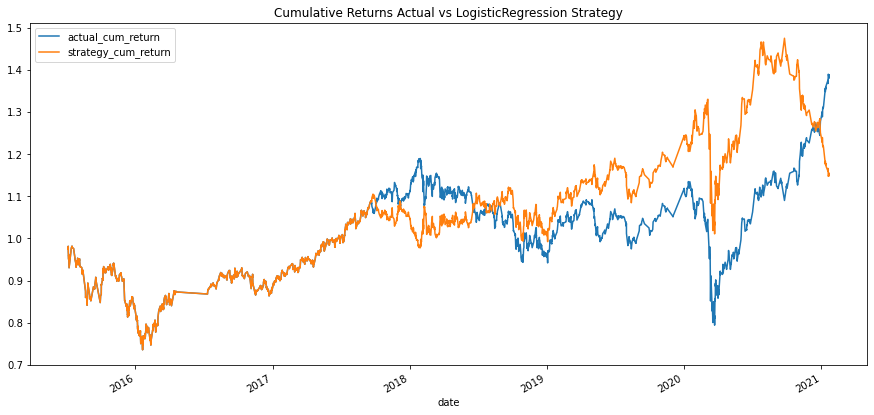

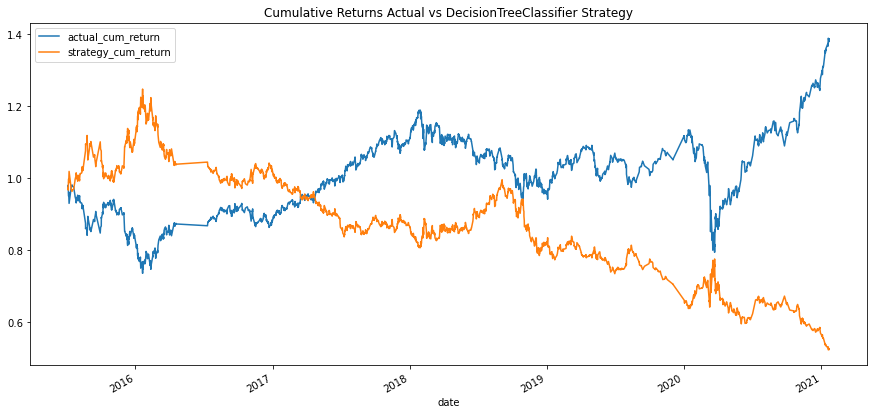

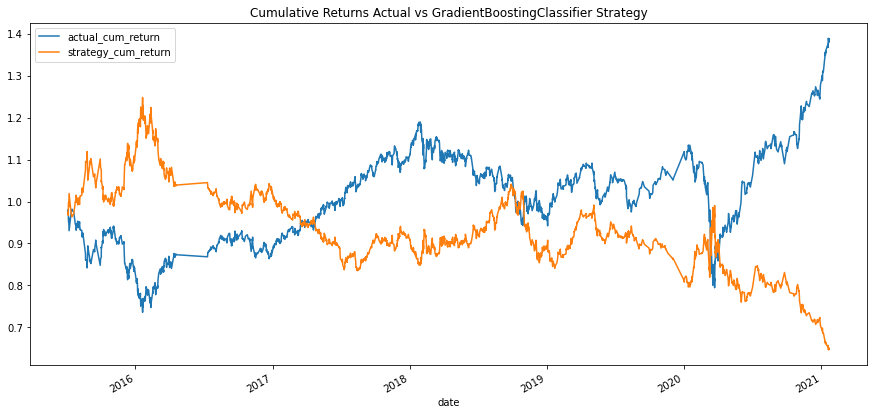

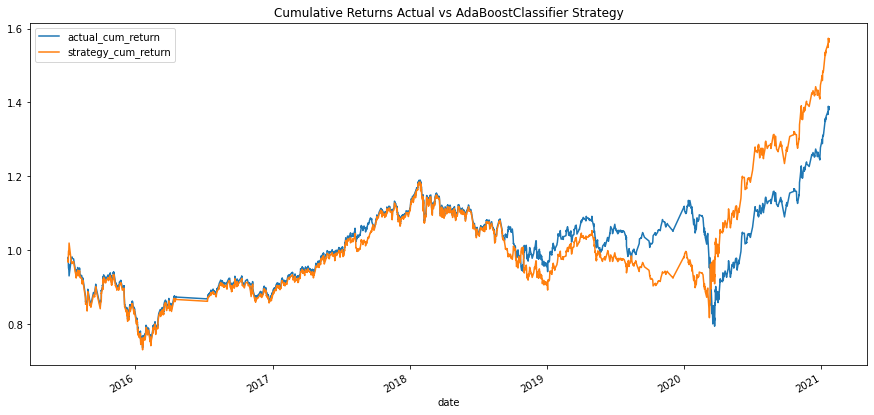

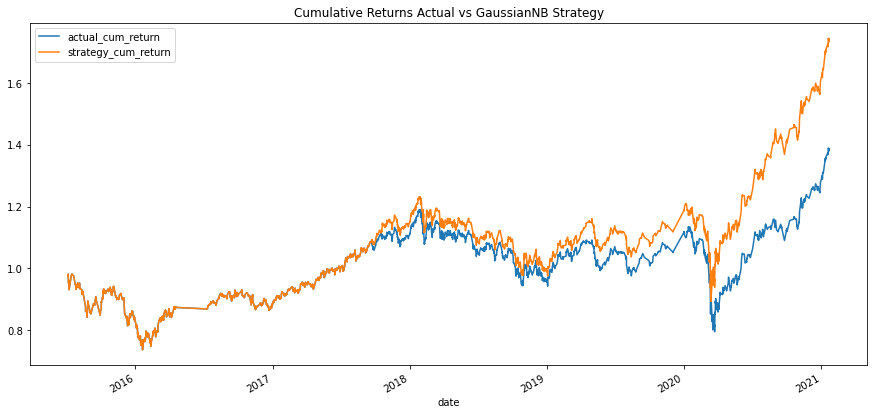

In [30]:
# Altering the instructions a little to automate iterating through multiple machine learning architectures
# iterate through each of the models to plot cumulative returns

for name in alternate_models:
    # Calculate the cumulative stategy return
    alternate_models[name]['df']['strategy_cum_return'] = (1 + alternate_models[name]['df']["Strategy Returns"]).cumprod()

    # Calculate the actual stategy return
    alternate_models[name]['df']['actual_cum_return'] = (1 + alternate_models[name]['df']["Actual Returns"]).cumprod()
    
    
    # display the end of the cumulative return
    print(f"{name} Strategy Cumulative Return Preview:")
    display(alternate_models[name]['df'].tail())
    
    # Plot the actual returns versus the strategy returns
    cum_actual_strategy_plot = alternate_models[name]['df'][['actual_cum_return','strategy_cum_return']].plot(
        figsize=(15,7),
        title=f'Cumulative Returns Actual vs {name} Strategy'
    )
    # save plot
    cum_actual_strategy_plot.figure.savefig(f'images/actual_vs_{name}_strategy_cum_returns.png', bbox_inches='tight')
    

In [31]:
# To make it easier to compare results across the various strategies, 
# create a data frame that wiil have all of the cumulative returns 

# initialuze the datasets with the actual returns and the returns from the
# SMA signal algorithm
datasets = [
    (1 + signals_df.loc[X_test.index.min():,'Actual Returns']).cumprod(),
    (1 + signals_df.loc[X_test.index.min():,'Strategy Returns']).cumprod()
]

names = [
    'Actual',
    'Signal'    
]

# Add the cumulative returns from the models evaluated
for name in alternate_models:
    datasets.append(alternate_models[name]['df']['strategy_cum_return'])
    names.append(name)
    
cumulative_returns = pd.concat(datasets,axis=1)
cumulative_returns.columns=names

# drop rows with no data
cumulative_returns = cumulative_returns.dropna()

# preview
display(cumulative_returns.tail())

,Actual,Signal,SVC,LogisticRegression,DecisionTreeClassifier,GradientBoostingClassifier,AdaBoostClassifier,GaussianNB
date,,,,,,,,
2021-01-22 09:30:00,1.379925,0.652062,1.509892,1.155177,0.526754,0.650664,1.562834,1.733323
2021-01-22 11:30:00,1.383243,0.650494,1.513523,1.152399,0.525487,0.649099,1.566592,1.737491
2021-01-22 13:45:00,1.386147,0.651859,1.516700,1.149980,0.524384,0.647737,1.569880,1.741138
2021-01-22 14:30:00,1.388221,0.652834,1.518969,1.148260,0.523600,0.646768,1.572229,1.743743
2021-01-22 15:45:00,1.386976,0.652249,1.517607,1.149289,0.524069,0.647347,1.570820,1.742180


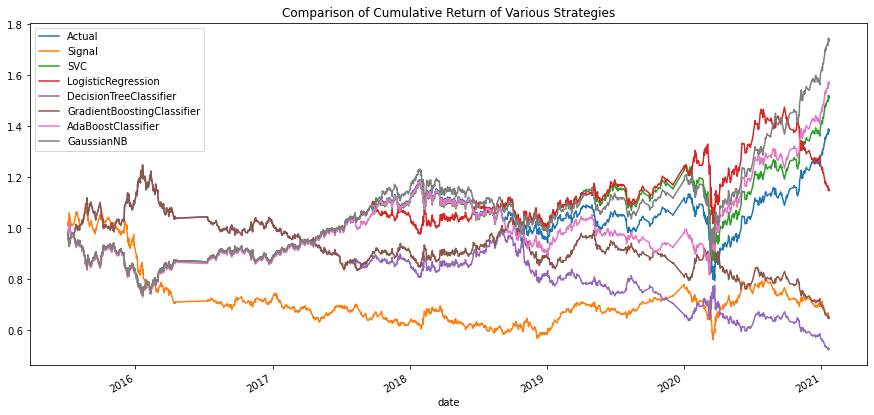

In [32]:
# Plot the actual returns versus the strategy returns
cum_strategy_plots = cumulative_returns.plot(
    figsize=(15,7),
    title=f'Comparison of Cumulative Return of Various Strategies'
)
# save plot
cum_strategy_plots.figure.savefig(f'images/cum_strategy_plots.png', bbox_inches='tight')


In [33]:
# For the fun of it, permute each of the above model with the tuning permutations from Part 2

# Tune models by evaluationg several training dataset sizes
training_dataset_months = [3,6,12,18]

# Tune models by evaluationg several short SMA window sizes
short_window_sizes = [3,4,6]

# Tune models by evaluationg several long SMA window sizes
long_window_sizes = [60,180,252]

# evaluate several classification models
# define a dictionary to manage each machine learning 
alternate_models = {}

# Initiate the model instances
# add SVC to set even thought it was done previously to make it 
# easier to compare

alternate_models['SVC'] = {
        "model": svm.SVC()
    }
alternate_models['LogisticRegression'] = {
        "model": LogisticRegression()
    }
alternate_models['DecisionTreeClassifier'] = {
        "model": DecisionTreeClassifier()
    }
alternate_models['GradientBoostingClassifier'] = {
        "model": GradientBoostingClassifier()
    }
alternate_models['AdaBoostClassifier'] = {
        "model": AdaBoostClassifier()
    }
alternate_models['GaussianNB'] = {
        "model": GaussianNB()
    }


date,2021-01-22 15:45:00
actual,1.396242
signal,0.654813
SVC-tr(3)-sw(3)-lw(60),1.517607
SVC-tr(3)-sw(3)-lw(180),1.517607
SVC-tr(3)-sw(3)-lw(252),1.554355
SVC-tr(3)-sw(4)-lw(60),1.517607
SVC-tr(3)-sw(4)-lw(180),1.517607
SVC-tr(3)-sw(4)-lw(252),1.554355
SVC-tr(3)-sw(6)-lw(60),1.517607
SVC-tr(3)-sw(6)-lw(180),1.517607


maximum cumulative return for SVC models was 1.84166422011223 from model permutation SVC-tr(6)-sw(3)-lw(60)


date,2021-01-22 15:45:00
actual,1.396242
signal,0.654813
LogisticRegression-tr(3)-sw(3)-lw(60),1.149289
LogisticRegression-tr(3)-sw(3)-lw(180),1.149289
LogisticRegression-tr(3)-sw(3)-lw(252),1.177118
LogisticRegression-tr(3)-sw(4)-lw(60),1.149289
LogisticRegression-tr(3)-sw(4)-lw(180),1.149289
LogisticRegression-tr(3)-sw(4)-lw(252),1.177118
LogisticRegression-tr(3)-sw(6)-lw(60),1.149289
LogisticRegression-tr(3)-sw(6)-lw(180),1.149289


maximum cumulative return for LogisticRegression models was 1.8753048264129628 from model permutation LogisticRegression-tr(12)-sw(3)-lw(60)


date,2021-01-22 15:45:00
actual,1.396242
signal,0.654813
DecisionTreeClassifier-tr(3)-sw(3)-lw(60),0.627551
DecisionTreeClassifier-tr(3)-sw(3)-lw(180),0.678171
DecisionTreeClassifier-tr(3)-sw(3)-lw(252),0.656928
DecisionTreeClassifier-tr(3)-sw(4)-lw(60),0.572142
DecisionTreeClassifier-tr(3)-sw(4)-lw(180),0.520820
DecisionTreeClassifier-tr(3)-sw(4)-lw(252),0.699848
DecisionTreeClassifier-tr(3)-sw(6)-lw(60),0.619977
DecisionTreeClassifier-tr(3)-sw(6)-lw(180),0.606956


maximum cumulative return for DecisionTreeClassifier models was 1.3291785550873472 from model permutation DecisionTreeClassifier-tr(18)-sw(4)-lw(252)


date,2021-01-22 15:45:00
actual,1.396242
signal,0.654813
GradientBoostingClassifier-tr(3)-sw(3)-lw(60),0.676205
GradientBoostingClassifier-tr(3)-sw(3)-lw(180),0.710039
GradientBoostingClassifier-tr(3)-sw(3)-lw(252),0.732468
GradientBoostingClassifier-tr(3)-sw(4)-lw(60),0.653885
GradientBoostingClassifier-tr(3)-sw(4)-lw(180),0.759116
GradientBoostingClassifier-tr(3)-sw(4)-lw(252),0.879886
GradientBoostingClassifier-tr(3)-sw(6)-lw(60),0.638911
GradientBoostingClassifier-tr(3)-sw(6)-lw(180),0.696804


maximum cumulative return for GradientBoostingClassifier models was 1.442481289355167 from model permutation GradientBoostingClassifier-tr(18)-sw(4)-lw(180)


date,2021-01-22 15:45:00
actual,1.396242
signal,0.654813
AdaBoostClassifier-tr(3)-sw(3)-lw(60),1.570820
AdaBoostClassifier-tr(3)-sw(3)-lw(180),1.570820
AdaBoostClassifier-tr(3)-sw(3)-lw(252),1.620903
AdaBoostClassifier-tr(3)-sw(4)-lw(60),1.570820
AdaBoostClassifier-tr(3)-sw(4)-lw(180),1.570820
AdaBoostClassifier-tr(3)-sw(4)-lw(252),1.620903
AdaBoostClassifier-tr(3)-sw(6)-lw(60),1.570820
AdaBoostClassifier-tr(3)-sw(6)-lw(180),1.570820


maximum cumulative return for AdaBoostClassifier models was 1.6209031685242383 from model permutation AdaBoostClassifier-tr(3)-sw(3)-lw(252)


date,2021-01-22 15:45:00
actual,1.396242
signal,0.654813
GaussianNB-tr(3)-sw(3)-lw(60),1.742180
GaussianNB-tr(3)-sw(3)-lw(180),1.742180
GaussianNB-tr(3)-sw(3)-lw(252),1.784366
GaussianNB-tr(3)-sw(4)-lw(60),1.742180
GaussianNB-tr(3)-sw(4)-lw(180),1.742180
GaussianNB-tr(3)-sw(4)-lw(252),1.784366
GaussianNB-tr(3)-sw(6)-lw(60),1.742180
GaussianNB-tr(3)-sw(6)-lw(180),1.742180


maximum cumulative return for GaussianNB models was 1.7843655630474453 from model permutation GaussianNB-tr(3)-sw(3)-lw(252)


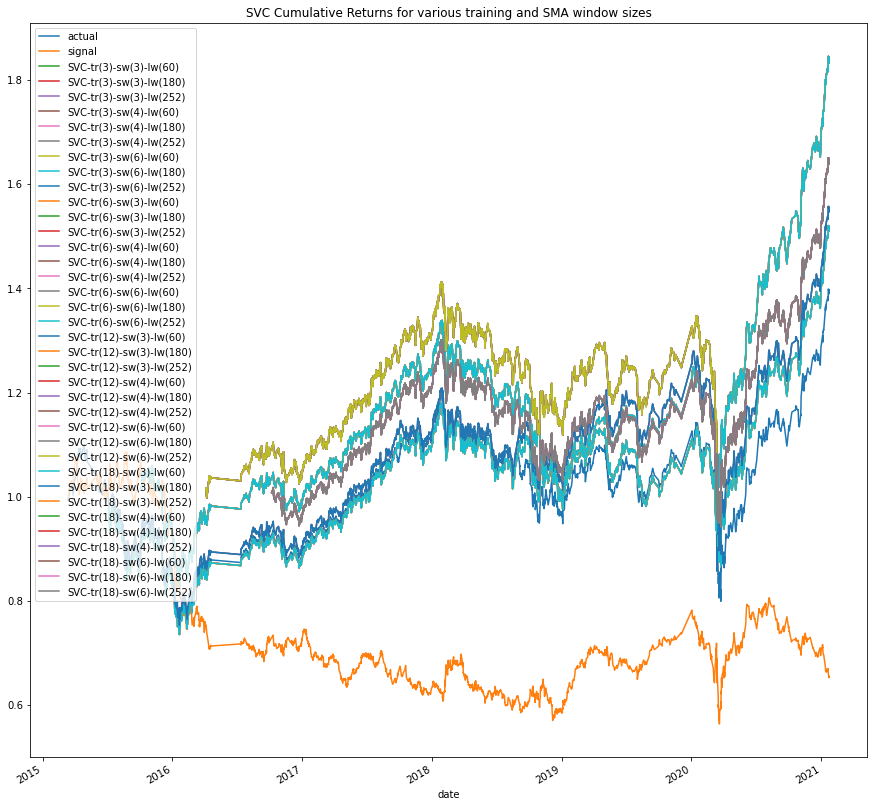

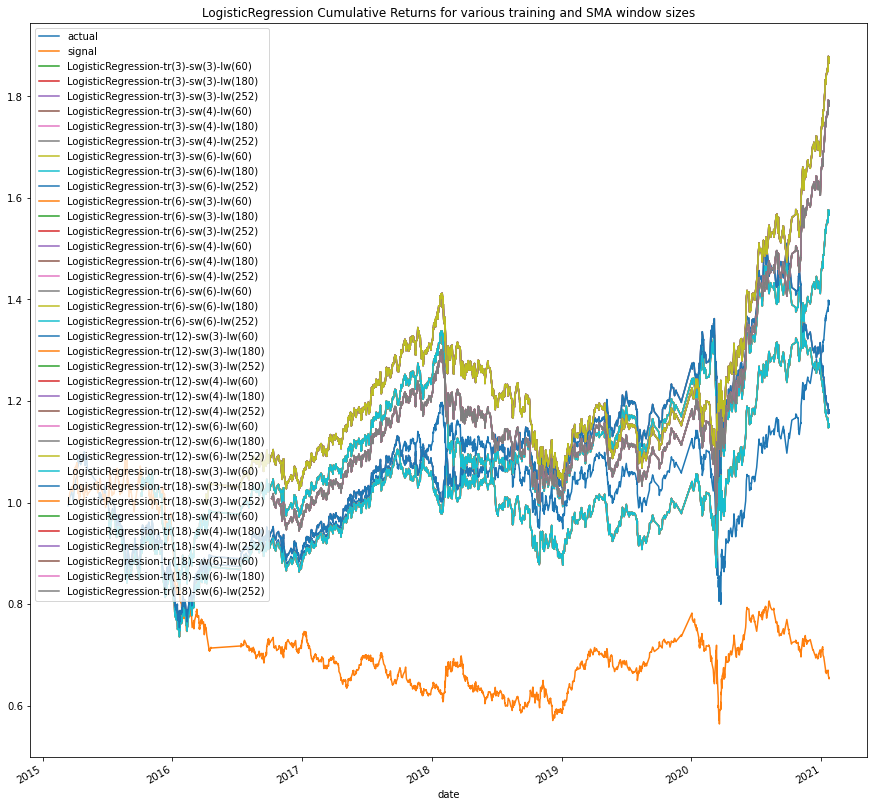

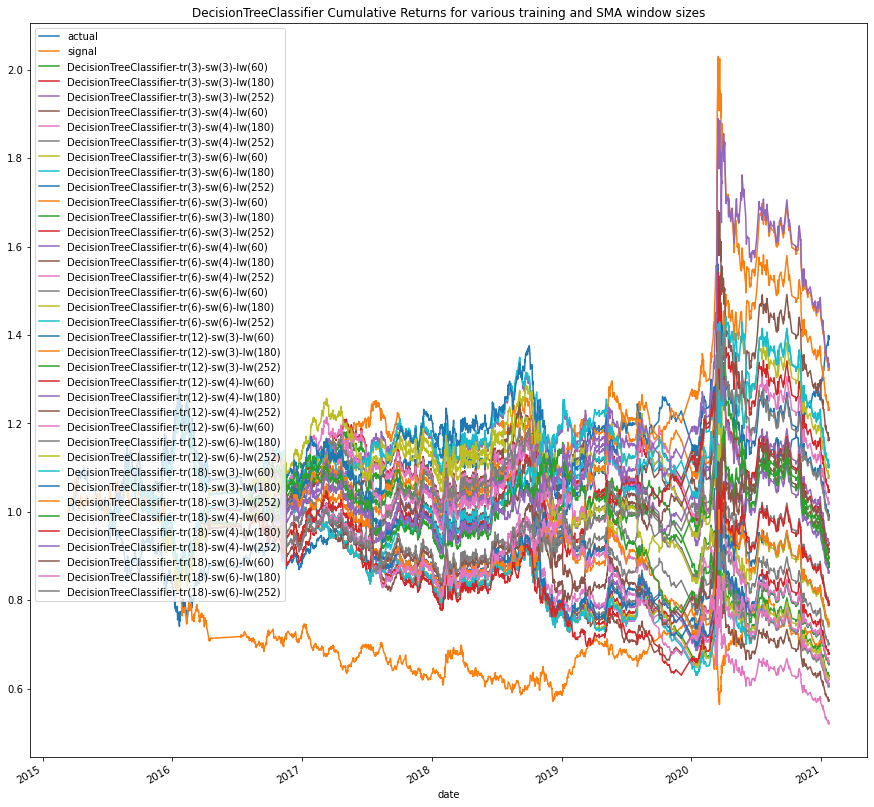

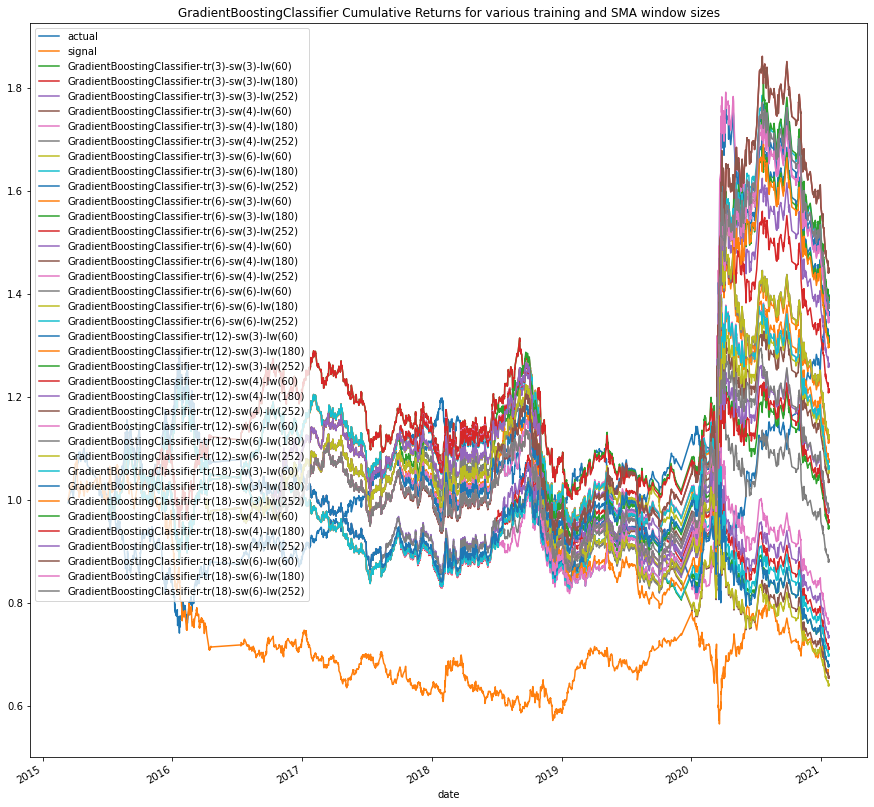

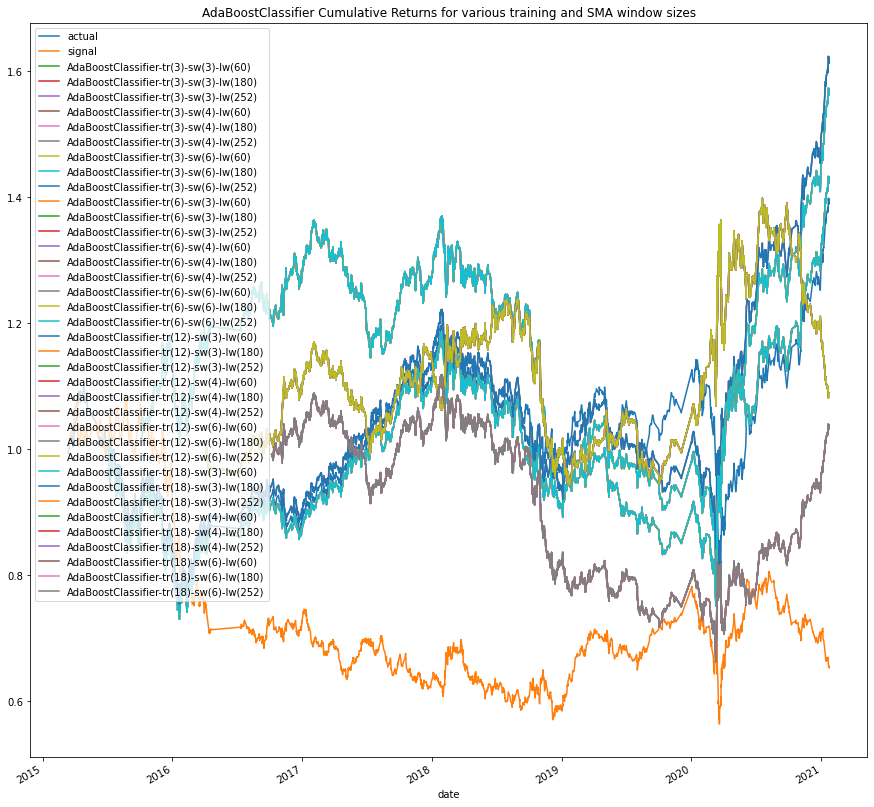

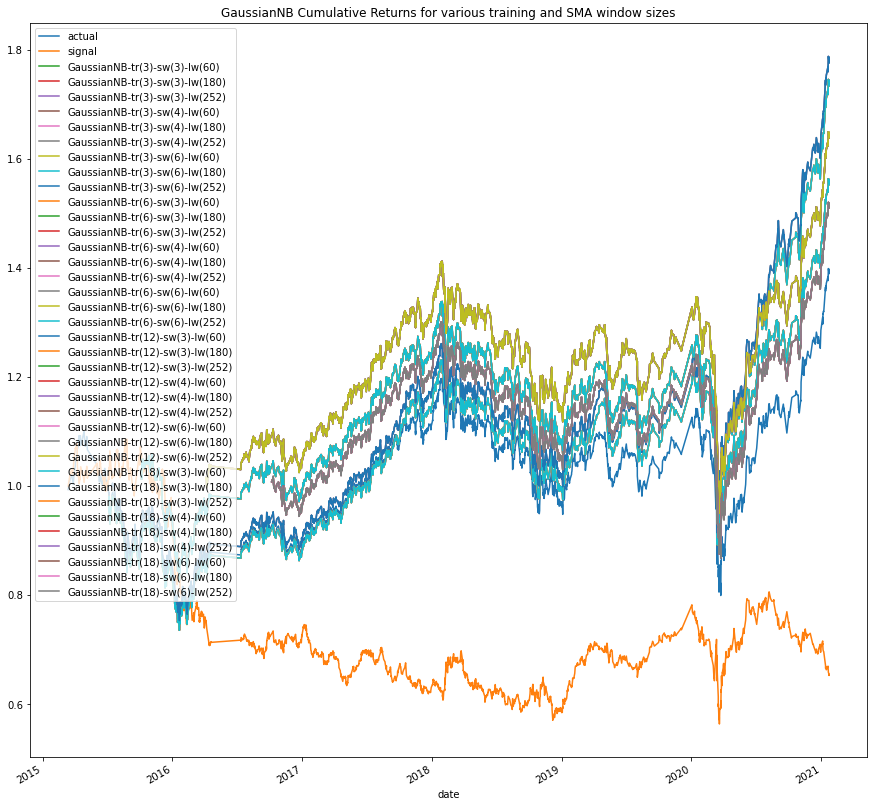

In [34]:
models = {}
# construct the model permutations and evaluate the model permutations
for name in alternate_models:
    returns = None
    max_return = 0
    selected_model = None
    for training_months in training_dataset_months:
        for short_window_size in short_window_sizes:
            for long_window_size in long_window_sizes:
                # create a key for this model permutation
                model_key = f"{name}-tr({training_months})-sw({short_window_size})-lw({long_window_size})"
                
                # configure model permutation
                models[model_key] = {
                    "model_name":name,
                    "training_months":training_months,
                    "short_window_size":short_window_size,
                    "long_window_size":long_window_size,
                    "model":alternate_models[name]["model"],
                }
                
                # create the signals data set with the actual returns, fast and slow SMA, signal and strategy returns
                models[model_key]['signals_df'] = make_signals_df(short_window_size,long_window_size)

                # create training and testing datasets
                models[model_key]['X_train_scaled'], models[model_key]['y_train'], models[model_key]['X_test_scaled'], models[model_key]['y_test'] = create_train_test_datasets(training_months)

                # get predictions
                models[model_key]['y_predictions'] =  get_predictions(
                    models[model_key]['model'], 
                    models[model_key]['X_train_scaled'], 
                    models[model_key]['y_train'], 
                    models[model_key]['X_test_scaled'])

                # backtest model
                models[model_key]['backtest'] = backtest_model(
                    model_key,
                    models[model_key]['y_test'],
                    models[model_key]['y_predictions'],
                    models[model_key]['signals_df'].loc[models[model_key]['y_test'].index.min():,'Actual Returns'],
                )   
                
                # add the cumulative return to the list of returns for plotting
                # add the actual and signal returns if the 
                if returns is None:
                    # This is the permutation for the model
                    # create the returns dataframe and add the actual returns and the signal returns
                    returns = {
                        "actual": (1 + models[model_key]['signals_df']['Actual Returns']).cumprod(),
                        "signal": (1 + models[model_key]['signals_df']['Strategy Returns']).cumprod()
                    }
                returns[model_key] = models[model_key]['backtest']['strategy_cum_return']
                if returns[model_key].iloc[-1] > max_return:
                    max_return = returns[model_key].iloc[-1]
                    selected_model = model_key
                    
    # create a plot for the family of returns for the range of training monts, and SMA window sizes
    returns_df = pd.DataFrame(returns)
    model_family_plot = returns_df.plot(
        figsize=(15,15),
        title=f'{name} Cumulative Returns for various training and SMA window sizes'
    )
    
    # save plot
    model_family_plot.figure.savefig(f'images/{name}_returns.png', bbox_inches='tight')

    # show the final returns for the family
    display(returns_df.iloc[-1:,:].T)

    # show the max return achieved with the model
    print(f"maximum cumulative return for {name} models was {max_return} from model permutation {selected_model}")
    


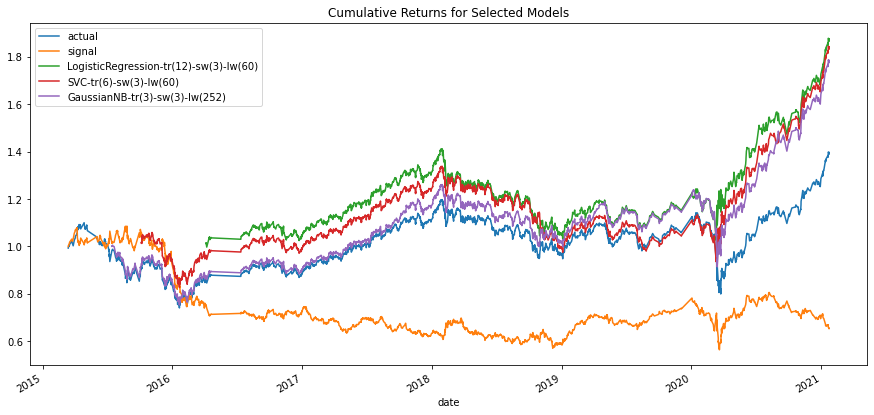

In [35]:
# Plot the three best models

selected_models = [
    'LogisticRegression-tr(12)-sw(3)-lw(60)',
    'SVC-tr(6)-sw(3)-lw(60)',
    'GaussianNB-tr(3)-sw(3)-lw(252)'
]

returns = None

for model_name in selected_models:
    if returns is None:
        # This is the permutation for the model
        # create the returns dataframe and add the actual returns and the signal returns
        returns = {
            "actual": (1 + models[model_name]['signals_df']['Actual Returns']).cumprod(),
            "signal": (1 + models[model_name]['signals_df']['Strategy Returns']).cumprod()
        }
    returns[model_name] = models[model_name]['backtest']['strategy_cum_return']


# create a plot for the family of returns for the range of training monts, and SMA window sizes
returns_df = pd.DataFrame(returns)
selected_models_plot = returns_df.plot(
    figsize=(15,7),
    title=f'Cumulative Returns for Selected Models'
)

# save plot
selected_models_plot.figure.savefig(f'images/selected_models_returns.png', bbox_inches='tight')
